# BA 305 Final Project: Predicting Loan Outcomes
**Ania Shaheed**

## Project Goals
Can we build a predictive model identifying risky borrowers/applications? What are the top
predictors?
- **Experiment 1**: Pre vs. Post Loan Issuance
    - Can we predict loan status before a loan is issued saving investors from bad loans?
    - Can we predict loan status in real time allowing investors to charge off sooner than later?
- **Experiment 2**: Predictive Modeling Methods
    - Is there a superior individual classifer?
    - Does stacking classifiers help create a better model?

## The Data: Lending Club Loans
- **Source**: https://www.kaggle.com/datasets/adarshsng/lending-club-loan-data-csv/data
- **Data dictionary**: https://docs.google.com/spreadsheets/d/17SZBRoidWvrpUhi0edpdCitEla2qyj_a/edit?usp=sharing&ouid=100479713656241030849&rtpof=true&sd=true
- **Target variable**: *loan_status*
  - *Fully Paid* - Loan has been completely repaid by the borrower.
  - *Current* - Borrower is actively making on-time payments.
  - *In Grace Period* - Borrower is slightly late but within the acceptable grace period.
  - *Late (16-30 days)* - Borrower has missed a payment and is more than two weeks overdue.
  - *Late (31-120 days)* - Borrower is significantly overdue; high risk of default.
  - *Charged Off* - Loan has been written off as a loss by the lender due to nonpayment.
  - *Default* - Borrower has failed to meet loan obligations; considered in default.
  - *Does not meet the credit policy. Status: Fully Paid* - Borrower was considered a higher risk but repaid the loan in full.
  - *Does not meet the credit policy. Status: Charged Off* - Borrower did not meet standard credit criteria and failed to repay the loan.

## Setup

In [192]:
# importing libraries
import pandas as pd
import numpy as np

from ydata_profiling import ProfileReport
import missingno as msno
from datetime import datetime

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import StratifiedKFold

from sklearn.model_selection import GridSearchCV

from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import StackingClassifier

from tensorflow.keras.layers import BatchNormalization

from sklearn.metrics import (
    confusion_matrix, 
    ConfusionMatrixDisplay, 
    roc_curve, 
    auc,
    classification_report, 
    accuracy_score,
    roc_auc_score,
    precision_recall_curve
)

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from tensorflow.keras.utils import to_categorical

In [271]:
# loading dataset
dataset_path = '/Users/ania/Documents/bu/semester 6/BA 305/Project/loan.csv'
df = pd.read_csv(dataset_path, low_memory = False)

In [418]:
# changing display options
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 100)
pd.set_option('display.width', 1000)

## Exploratory Data Analysis

### Data Structure

First inspection of the data

In [50]:
# dimensions of dataset
df.shape

(2260668, 145)

In [51]:
# inspect first 5 rows
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
0,NaN,NaN,2500,2500,2500.0,36 months,13.56,84.92,C,C1,Chef,10+ years,RENT,55000.0,Not Verified,Dec-2018,Current,n,NaN,NaN,debt_consolidation,Debt consolidation,109xx,NY,18.24,0.0,Apr-2001,1.0,NaN,45.0,9.0,1.0,4341,10.3,34.0,w,2386.02,2386.02,167.02,167.02,113.98,53.04,0.0,0.0,0.0,Feb-2019,84.92,Mar-2019,Feb-2019,0.0,NaN,1,Individual,NaN,NaN,NaN,0.0,0.0,16901.0,2.0,2.0,1.0,2.0,2.0,12560.0,69.0,2.0,7.0,2137.0,28.0,42000.0,1.0,11.0,2.0,9.0,1878.0,34360.0,5.9,0.0,0.0,140.0,212.0,1.0,1.0,0.0,1.0,NaN,2.0,NaN,0.0,2.0,5.0,3.0,3.0,16.0,7.0,18.0,5.0,9.0,0.0,0.0,0.0,3.0,100.0,0.0,1.0,0.0,60124.0,16901.0,36500.0,18124.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,30000,30000,30000.0,60 months,18.94,777.23,D,D2,Postmaster,10+ years,MORTGAGE,90000.0,Source Verified,Dec-2018,Current,n,NaN,NaN,debt_consolidation,Debt consolidation,713xx,LA,26.52,0.0,Jun-1987,0.0,71.0,75.0,13.0,1.0,12315,24.2,44.0,w,29387.75,29387.75,1507.11,1507.11,612.25,894.86,0.0,0.0,0.0,Feb-2019,777.23,Mar-2019,Feb-2019,0.0,NaN,1,Individual,NaN,NaN,NaN,0.0,1208.0,321915.0,4.0,4.0,2.0,3.0,3.0,87153.0,88.0,4.0,5.0,998.0,57.0,50800.0,2.0,15.0,2.0,10.0,24763.0,13761.0,8.3,0.0,0.0,163.0,378.0,4.0,3.0,3.0,4.0,NaN,4.0,NaN,0.0,2.0,4.0,4.0,9.0,27.0,8.0,14.0,4.0,13.0,0.0,0.0,0.0,6.0,95.0,0.0,1.0,0.0,372872.0,99468.0,15000.0,94072.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,5000,5000,5000.0,36 months,17.97,180.69,D,D1,Administrative,6 years,MORTGAGE,59280.0,Source Verified,Dec-2018,Current,n,NaN,NaN,debt_consolidation,Debt cons

In [52]:
# list of columns
for col in df.columns:
    print(col)

id
member_id
loan_amnt
funded_amnt
funded_amnt_inv
term
int_rate
installment
grade
sub_grade
emp_title
emp_length
home_ownership
annual_inc
verification_status
issue_d
loan_status
pymnt_plan
url
desc
purpose
title
zip_code
addr_state
dti
delinq_2yrs
earliest_cr_line
inq_last_6mths
mths_since_last_delinq
mths_since_last_record
open_acc
pub_rec
revol_bal
revol_util
total_acc
initial_list_status
out_prncp
out_prncp_inv
total_pymnt
total_pymnt_inv
total_rec_prncp
total_rec_int
total_rec_late_fee
recoveries
collection_recovery_fee
last_pymnt_d
last_pymnt_amnt
next_pymnt_d
last_credit_pull_d
collections_12_mths_ex_med
mths_since_last_major_derog
policy_code
application_type
annual_inc_joint
dti_joint
verification_status_joint
acc_now_delinq
tot_coll_amt
tot_cur_bal
open_acc_6m
open_act_il
open_il_12m
open_il_24m
mths_since_rcnt_il
total_bal_il
il_util
open_rv_12m
open_rv_24m
max_bal_bc
all_util
total_rev_hi_lim
inq_fi
total_cu_tl
inq_last_12m
acc_open_past_24mths
avg_cur_bal
bc_open_to_buy
b

In [538]:
# separating features by categorical and numeric
num = df.select_dtypes(include = "number").columns.tolist()
cat = df.select_dtypes(include = "object").columns.tolist()

print("Numeric Features:", len(num))
print("Categorical Features:", len(cat))

Numeric Features: 109
Categorical Features: 36


<Axes: >

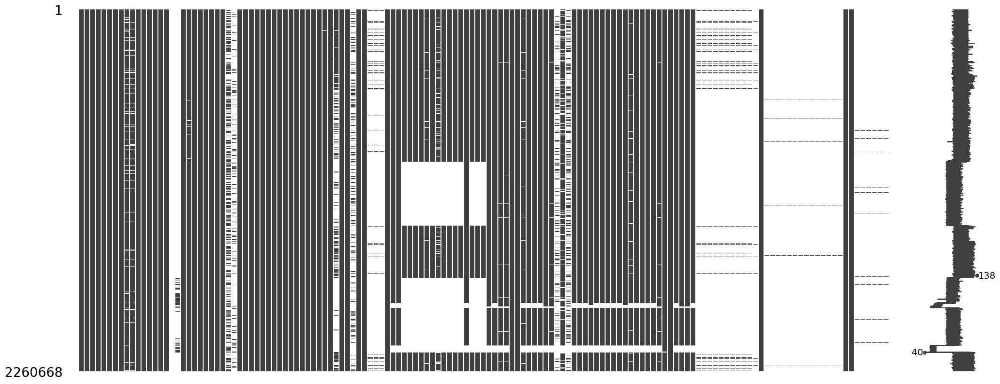

In [53]:
# visualizing missing data
msno.matrix(df)

### Target Variable

In [54]:
# making sure target variable has no nulls
df.isna().sum().loan_status

0

**The distribution of the raw *loan_status* target variable.**
- Most borrowers have fully paid their loan or current paying it off responsibly
- Relatively fewer borrower who are missing payments

In [68]:
# class distribution
counts = df.loan_status.value_counts()
percents = df.loan_status.value_counts(normalize = True) * 100

# show counts and ratios
distribution = pd.DataFrame({
    'Count': counts,
    'Percentage (%)': percents.round(2)
})

print(distribution)

                                                      Count  Percentage (%)
loan_status                                                                
Fully Paid                                          1041952           46.09
Current                                              919695           40.68
Charged Off                                          261655           11.57
Late (31-120 days)                                    21897            0.97
In Grace Period                                        8952            0.40
Late (16-30 days)                                      3737            0.17
Does not meet the credit policy. Status:Fully Paid     1988            0.09
Does not meet the credit policy. Status:Charged...      761            0.03
Default                                                  31            0.00


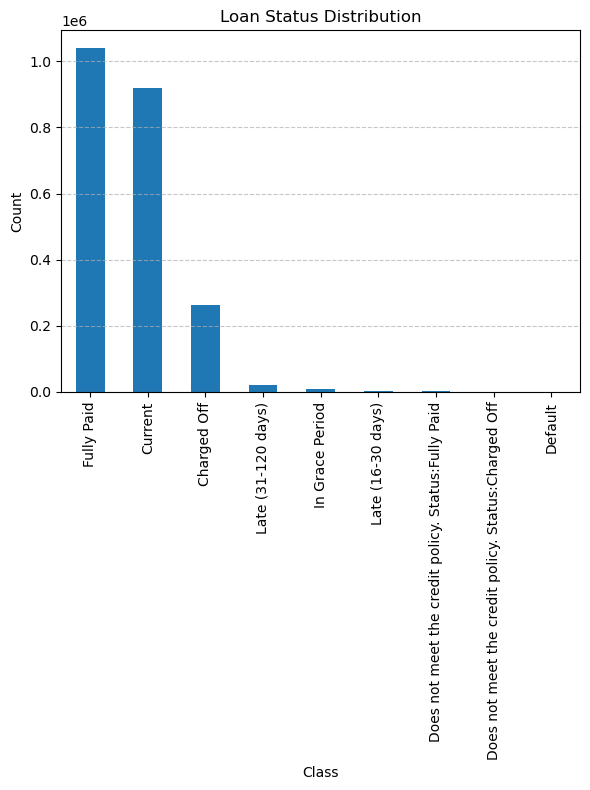

In [102]:
# distribution visualization
plt.figure(figsize = (6, 8))

counts.plot(kind = 'bar', rot = 90)

plt.title('Loan Status Distribution')
plt.xlabel('Class')
plt.ylabel('Count')

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

**How does the distribution look after grouping classes by 'good' or 'risky'?**
- Binary version is appropriate for project objective
- 87% of borrower are 'good'
- Class imbalance and binary feature engineering to be addressed later

In [106]:
# grouping classes by 'good' and 'risky' borrowers
loan_status_mapping = {
    'Fully Paid': 'Good Borrower',
    'Current': 'Good Borrower',
    'In Grace Period': 'Good Borrower',
    'Late (16-30 days)': 'Risky Borrower',
    'Late (31-120 days)': 'Risky Borrower',
    'Charged Off': 'Risky Borrower',
    'Default': 'Risky Borrower',
    'Does not meet the credit policy. Status:Fully Paid': 'Risky Borrower',
    'Does not meet the credit policy. Status:Charged Off': 'Risky Borrower'
}

binary_loan_status = df.loan_status.map(loan_status_mapping)

In [110]:
# distribution of grouped loan_status
counts = binary_loan_status.value_counts()
percents = binary_loan_status.value_counts(normalize = True) * 100

distribution = pd.DataFrame({
    'Count': counts,
    'Percentage (%)': percents.round(2)
})

print(distribution)

                  Count  Percentage (%)
loan_status                            
Good Borrower   1970599           87.17
Risky Borrower   290069           12.83


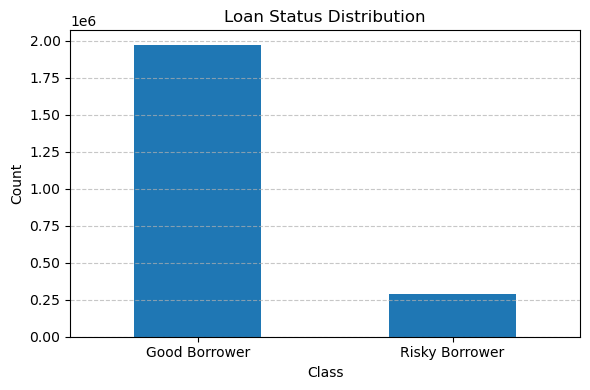

In [116]:
# grouped visualization
plt.figure(figsize = (6, 4))

counts.plot(kind = 'bar', rot = 0)

plt.title('Loan Status Distribution')
plt.xlabel('Class')
plt.ylabel('Count')

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

### Univariate

**The average borrower**:
- Teacher of 10+ years making \$65K annually, 20% going towards debt (DTI ratio)
- Mortgaging a home in California
- Borrowed $13k in cash to consolidate debts and fully repaid over 36 months
- C1 subgrade and 13% interest rate
- 100% of trades never delinquent

In [540]:
# summary of numeric features
df[num].describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,annual_inc,url,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,annual_inc_joint,dti_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog,deferral_term,hardship_amount,hardship_length,hardship_dpd,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,settlement_amount,settlement_percentage,settlement_term
count,0.0,0.0,2.260668e+06,2.260668e+06,2.260668e+06,2.260668e+06,2.260668e+06,2.260664e+06,0.0,2.258957e+06,2.260639e+06,2.260638e+06,1.102166e+06,359156.000000,2.260639e+06,2.260639e+06,2.260668e+06,2.258866e+06,2.260639e+06,2.260668e+06,2.260668e+06,2.260668e+06,2.260668e+06,2.260668e+06,2.260668e+06,2.260668e+06,2.260668e+06,2.260668e+06,2.260668e+06,2.260523e+06,580775.000000,2260668.0,1.207100e+05,120706.000000,2.260639e+06,2.190392e+06,2.190392e+06,1.394538e+06,1.394539e+06,1.394539e+06,1.394539e+06,1.350744e+06,1.394539e+06,1.191818e+06,1.394539e+06,1.394539e+06,1.394539e+06,1.394320e+06,2.190392e+06,1.394539e+06,1.394538e+06,1.394538e+06,2.210638e+06,2.190322e+06,2.185733e+06,2.184597e+06,2.260523e+06,2.260639e+06,2.121597e+06,2.190391e+06,2.190391e+06,2.190392e+06,2.210638e+06,2.187256e+06,519701.000000,1.965233e+06,740359.000000,2.190392e+06,2.190392e+06,2.190392e+06,2.202078e+06,2.190392e+06,2.190392e+06,2.190392e+06,2.190391e+06,2.190392e+06,2.202078e+06,2.107011e+06,2.190392e+06,2.190392e+06,2.190392e+06,2.190237e+06,2.185289e+06,2.259303e+06,2.260563e+06,2.190392e+06,2.210638e+06,2.210638e+06,2.190392e+06,1.080200e+05,108021.000000,108021.000000,108021.000000,106184.000000,108021.000000,108021.000000,108021.000000,108021.000000,35942.000000,10613.0,10613.000000,10613.0,10613.000000,8426.000000,10613.000000,10613.000000,33056.000000,33056.000000,33056.000000
mean,NaN,NaN,1.504693e+04,1.504166e+04,1.502344e+04,1.309291e+01,4.458076e+02,7.799243e+04,NaN,1.882420e+01,3.068792e-01,5.768354e-01,3.454092e+01,72.312842,1.161240e+01,1.975278e-01,1.665846e+04,5.033770e+01,2.416255e+01,4.446293e+03,4.445295e+03,1.182403e+04,1.180594e+04,9.300142e+03,2.386352e+03,1.462469e+00,1.360740e+02,2.259328e+01,3.364015e+03,1.814580e-02,44.164220,1.0,1.236246e+05,19.251817,4.147942e-03,2.327317e+02,1.424922e+05,9.344199e-01,2.779407e+00,6.764314e-01,1.562752e+00,2.122236e+01,3.550665e+04,6.914098e+01,1.290133e+00,2.749923e+00,5.806393e+03,5.703230e+01,3.457394e+04,1.012867e+00,1.477304e+00,2.036667e+00,4.521656e+00,1.354780e+04,1.139426e+04,5.789995e+01,8.464413e-03,1.236983e+01,1.257378e+02,1.814916e+02,1.402409e+01,8.297469e+00,1.555382e+00,2.484485e+01,39.303090,7.024194e+00,35.782223,5.002082e-01,3.67

In [541]:
# summary of categorical features
df[cat].describe(include = 'all')

,term,grade,sub_grade,emp_title,emp_length,home_ownership,verification_status,issue_d,loan_status,pymnt_plan,desc,purpose,title,zip_code,addr_state,earliest_cr_line,initial_list_status,last_pymnt_d,next_pymnt_d,last_credit_pull_d,application_type,verification_status_joint,sec_app_earliest_cr_line,hardship_flag,hardship_type,hardship_reason,hardship_status,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_loan_status,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date
count,2260668,2260668,2260668,2093699,2113761,2260668,2260668,2260668,2260668,2260668,126065,2260668,2237342,2260667,2260668,2260639,2260668,2258242,957061,2260595,2260668,115730,108021,2260668,10613,10613,10613,10613,10613,10613,10613,2260668,2260668,33056,33056,33056
unique,2,7,35,512694,11,6,3,139,9,2,124500,14,63154,956,51,754,2,135,105,140,2,3,663,2,1,9,3,26,27,26,5,2,2,82,3,89
top,36 months,B,C1,Teacher,10+ years,MORTGAGE,Source Verified,Mar-2016,Fully Paid,n,,debt_consolidation,Debt consolidation,112xx,CA,Sep-2004,w,Feb-2019,Mar-2019,Feb-2019,Individual,Not Verified,Aug-2006,N,INTEREST ONLY-3 MONTHS DEFERRAL,NATURAL_DISASTER,COMPLETED,Sep-2017,Dec-2017,Sep-2017,Late (16-30 days),Cash,N,Feb-2019,ACTIVE,Jan-2019
freq,1609754,663557,145903,38824,748005,1111450,886231,61992,1041952,2259986,252,1277877,1153293,23908,314533,15400,1535467,934725,953821,1398266,2139958,57403,998,2259783,10613,2965,7541,2444,1756,1715,4622,2182546,2227612,2730,14811,1725


**Analyzing each feature to understand the data better**
- Inspecting the distributions of features
- Unusable features are empty or constant
- Significant missing data to be addressed

In [ ]:
# generating and saving report
profile = ProfileReport(df,
                        html = {'style':{'full_width':True}},
                        minimal = True, 
                        progress_bar = False)

profile.to_file("univariate.html")

In [395]:
# report results
profile.to_notebook_iframe()

### Missing Values

**Inspecting features that have a lot of missing values**
- Harship, settlement, and joint fields are empty because these are related to uncommon circumstances
- 'Months since columns' are empty because the event never occurred
- The rest are unusable, with over 38% missing values

In [544]:
# counts and percents of nulls
count = df.isna().sum()
percent = 100 * count / len(df)

# table of missing values per column
table = pd.concat([count, percent], axis = 1)
table.columns = ["Count", "Percent"]

# define threshold for too many nulls
threshold = len(df) * 0.1

# filter by threshold
high_nulls = table[table['Count'] > threshold].sort_values(by = 'Percent', ascending = False)

# show results
high_nulls

,Count,Percent
id,2260668,100.000000
url,2260668,100.000000
member_id,2260668,100.000000
orig_projected_additional_accrued_interest,2252242,99.627278
hardship_length,2250055,99.530537
hardship_reason,2250055,99.530537
hardship_status,2250055,99.530537
deferral_term,2250055,99.530537
hardship_amount,2250055,99.530537
hardship_start_date,2250055,99.530537


In [546]:
# obtain column names for high nulls counts
high_nulls.index

Index(['id', 'url', 'member_id', 'orig_projected_additional_accrued_interest', 'hardship_length', 'hardship_reason', 'hardship_status', 'deferral_term', 'hardship_amount', 'hardship_start_date', 'hardship_end_date', 'payment_plan_start_date', 'hardship_loan_status', 'hardship_dpd', 'hardship_payoff_balance_amount', 'hardship_last_payment_amount', 'hardship_type', 'debt_settlement_flag_date', 'settlement_status', 'settlement_date', 'settlement_amount', 'settlement_percentage', 'settlement_term', 'sec_app_mths_since_last_major_derog', 'sec_app_revol_util', 'revol_bal_joint', 'sec_app_earliest_cr_line', 'sec_app_open_acc', 'sec_app_collections_12_mths_ex_med', 'sec_app_chargeoff_within_12_mths', 'sec_app_open_act_il', 'sec_app_num_rev_accts', 'sec_app_mort_acc', 'sec_app_inq_last_6mths', 'verification_status_joint', 'dti_joint', 'annual_inc_joint', 'desc', 'mths_since_last_record', 'mths_since_recent_bc_dlq', 'mths_since_last_major_derog', 'mths_since_recent_revol_delinq',
       'next_py

**During EDA, we noticed systematically missing information for a subset of borrowers. Let's revisit**
- First, exclude unusable features due to nulls as well as features with no nulls
- Inspect the missing values matrix for remaining nulls
- This empty subset of records stil exist, with 23-30 of the same feature absent
- No apparent reason --> delete as it is a relatively small portion of borrowers

<Axes: >

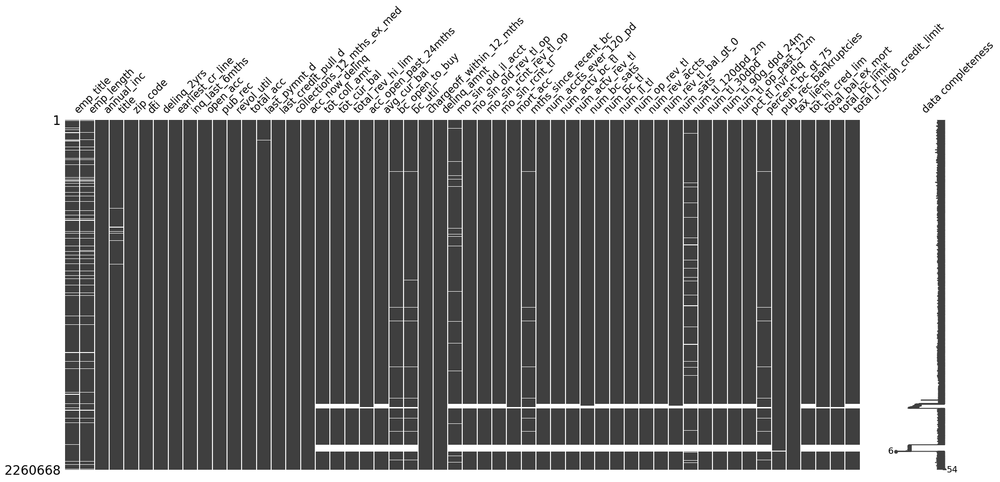

In [626]:
# temporarily excluding feature with high null counts
filter1 = df.drop(columns = high_nulls.index, axis = 1)

# filtering remaining features that still have nulls
nulls = filter1[filter1.columns[filter1.isna().sum() > 0]]
 
# visualizing missing values
msno.matrix(filter1[filter1.columns[filter1.isna().sum() > 0]], labels = True)

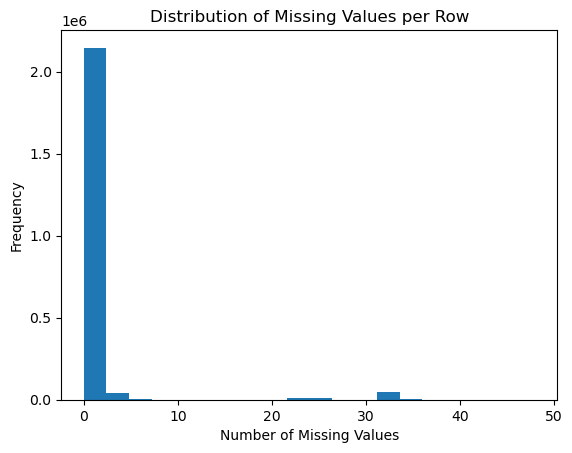

In [656]:
# calculating number of empty feature per row
row_nulls = filter1.isnull().sum(axis = 1)

# plotting distribution of row nulls
row_nulls.plot(kind = 'hist', bins = 20)

plt.title('Distribution of Missing Values per Row')
plt.xlabel('Number of Missing Values')
plt.ylabel('Frequency')

plt.show()

In [548]:
# filtering rows with mostly nulls
row_nulls = df.isnull().sum(axis = 1)
rows = df[row_nulls > 22]

# inspecting other feature to identify a reason
rows.describe(include = 'all')

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
count,0.0,0.0,2.260092e+06,2.260092e+06,2.260092e+06,2260092,2.260092e+06,2.260092e+06,2260092,2260092,2093203,2113264,2260092,2.260088e+06,2260092,2260092,2260092,2260092,0.0,126065,2260092,2236773,2260091,2260092,2.258389e+06,2.260063e+06,2260063,2.260062e+06,1.101756e+06,359050.000000,2.260063e+06,2.260063e+06,2.260092e+06,2.258290e+06,2.260063e+06,2260092,2.260092e+06,2.260092e+06,2.260092e+06,2.260092e+06,2.260092e+06,2.260092e+06,2.260092e+06,2.260092e+06,2.260092e+06,2257666,2.260092e+06,956737,2260019,2.259947e+06,580539.000000,2260092.0,2260092,1.202360e+05,120232.000000,115258,2.260063e+06,2.189816e+06,2.189816e+06,1.393962e+06,1.393963e+06,1.393963e+06,1.393963e+06,1.350178e+06,1.393963e+06,1.191319e+06,1.393963e+06,1.393963e+06,1.393963e+06,1.393744e+06,2.189816e+06,1.393963e+06,1.393962e+06,1.393962e+06,2.210062e+06,2.189746e+06,2.185170e+06,2.184034e+06,2.259947e+06,2.260063e+06,2.121031e+06,2.189815e+06,2.189815e+06,2.189816e+06,2.210062e+06,2.186693e+06,519463.000000,1.964704e+06,740040.000000,2.189816e+06,2.189816e+06,2.189816e+06,2.201502e+06,2.189816e+06,2.189816e+06,2.189816e+06,2.189815e+06,2.189816e+06,2.201502e+06,2.106435e+06,2.189816e+06,2.189816e+06,2.189816e+06,2.189661e+06,2.184726e+06,2.258727e+06,2.259987e+06,2.189816e+06,2.210062e+06,2.210062e+06,2.189816e+06,1.075620e+05,107563,107563.000000,107563.000000,107563.000000,105731.000000,107563.000000,107563.000000,107563.000000,107563.000000,35721.000000,2260092,10138,10138,10138,10138.0,10138.000000,10138,10138,10138,10138.0,10138.000000,10138,8050.000000,10138.000000,10138.000000,2260092,2260092,32848,32848,32848,32848.000000,32848.000000,32848.000000
unique,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,

### Multicollinearity

**Identifying highly correlated features that convey redundant information**
- Heatmap shows a significant amount of feature are highly correlated
- Defining high correlation as > 0.7
- Extracting features and correlations above threshold into a table
- These will be removed

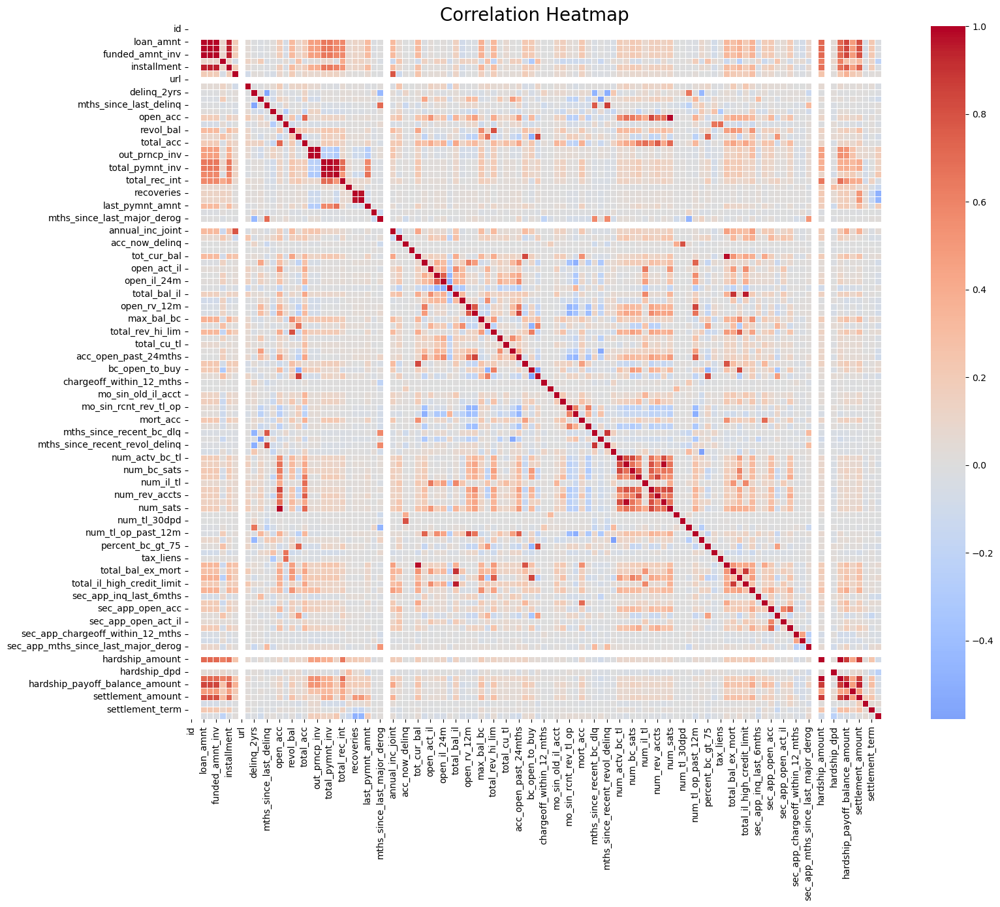

In [400]:
# correlation matrix
corr_matrix = df[num].corr()

# visualizing correlations
plt.figure(figsize = (18, 14))

sns.heatmap(
    corr_matrix,
    cmap = 'coolwarm',     
    center = 0,             
    square = True,       
    linewidths = 0.5,  
)

plt.title("Correlation Heatmap", fontsize = 20)
plt.tight_layout()
plt.show()

In [550]:
# correlation magnitudes
abs_corr = corr_matrix.abs()

# select upper triangle of correlation matrix
upper = abs_corr.where(np.triu(np.ones(abs_corr.shape), k = 1).astype(bool))

# features with correlation greater than 0.7
high_corr = []

for column in upper.columns:
    for row in upper.index:
        corr = upper.loc[row, column]
        if corr > 0.7:
            high_corr.append((column, row, corr))

# results
corr_table = pd.DataFrame(high_corr, columns = ["Feature 1", "Feature 2", "Correlation"])
print(corr_table)

                                     Feature 1                                   Feature 2  Correlation
0                                  funded_amnt                                   loan_amnt     0.999755
1                              funded_amnt_inv                                   loan_amnt     0.999038
2                              funded_amnt_inv                                 funded_amnt     0.999341
3                                  installment                                   loan_amnt     0.945627
4                                  installment                                 funded_amnt     0.945969
5                                  installment                             funded_amnt_inv     0.945119
6                                    total_acc                                    open_acc     0.717911
7                                out_prncp_inv                                   out_prncp     0.999999
8                              total_pymnt_inv                  

In [552]:
# obtaining redundant column names
corr_table["Feature 1"].unique()

array(['funded_amnt', 'funded_amnt_inv', 'installment', 'total_acc',
       'out_prncp_inv', 'total_pymnt_inv', 'total_rec_prncp',
       'collection_recovery_fee', 'mths_since_last_major_derog',
       'annual_inc_joint', 'open_il_24m', 'open_rv_24m',
       'total_rev_hi_lim', 'acc_open_past_24mths', 'avg_cur_bal',
       'bc_util', 'mths_since_recent_bc_dlq',
       'mths_since_recent_revol_delinq', 'num_actv_rev_tl', 'num_bc_sats',
       'num_bc_tl', 'num_op_rev_tl', 'num_rev_accts',
       'num_rev_tl_bal_gt_0', 'num_sats', 'num_tl_30dpd',
       'num_tl_op_past_12m', 'percent_bc_gt_75', 'tot_hi_cred_lim',
       'total_bal_ex_mort', 'total_bc_limit',
       'total_il_high_credit_limit', 'sec_app_mort_acc',
       'sec_app_num_rev_accts', 'hardship_amount',
       'orig_projected_additional_accrued_interest',
       'hardship_payoff_balance_amount', 'settlement_amount'],
      dtype=object)

## Data Pre-Processing

### Feature Selection

**Summary of dropped columns:**
- Implementing results of EDA
- Removing direct indicators of *loan_status*
- 145 features --> 57 features

In [272]:
drop_columns = [
    # empty or irrelevant
    "id", "member_id", "url", "zip_code", "desc", "emp_title", "title", 'issue_d', "acceptD", "expD", "ils_exp_d",
    "reviewStatusD", "creditPullD", "policy_code", "initial_list_status", "initialListStatus",

    # constant
    'policy_code', 'deferral_term',

    # hardship specifics
    "hardship_length", "hardship_type", "hardship_status", "hardship_start_date", "hardship_end_date", 
    "hardship_amount", "hardship_dpd", "hardship_loan_status", "hardship_reason", "hardship_payoff_balance_amount",
    "hardship_last_payment_amount", 

    # settlement specifics
    "debt_settlement_flag_date", "settlement_status", 
    "settlement_date", "settlement_amount", "settlement_percentage", "settlement_term",

    # joint application specifics
    "annual_inc_joint", "dti_joint", "verification_status_joint", "revol_bal_joint",
    "sec_app_earliest_cr_line", "sec_app_inq_last_6mths", "sec_app_mort_acc", "sec_app_open_acc",
    "sec_app_revol_util", "sec_app_open_act_il", "sec_app_num_rev_accts", "sec_app_chargeoff_within_12_mths",
    "sec_app_collections_12_mths_ex_med", "sec_app_mths_since_last_major_derog",
    
    # too many nulls
    'orig_projected_additional_accrued_interest', 'payment_plan_start_date', 'next_pymnt_d', 'il_util',
    'all_util', 'open_acc_6m', 'total_cu_tl', 'inq_last_12m', 'open_act_il', 'open_il_12m', 'open_il_24m',
    'total_bal_il', 'open_rv_12m', 'max_bal_bc', 'inq_fi', 'open_rv_24m',  

    # collinearity/redundancy
    'funded_amnt', 'funded_amnt_inv', 'installment', 'open_acc', 'out_prncp_inv', 'total_pymnt_inv', 
    'total_rec_prncp', 'collection_recovery_fee', 'open_il_12m', 'open_rv_12m', 'total_rev_hi_lim', 
    'tot_cur_bal', 'revol_util', 'num_actv_bc_tl', 'num_bc_tl', 'num_op_rev_tl', 'num_rev_accts', 
    'num_rev_tl_bal_gt_0', 'num_sats', 'num_tl_30dpd', 'num_tl_op_past_12m', 'percent_bc_gt_75', 
    'tot_hi_cred_lim', 'total_bal_ex_mort', 'total_bc_limit', 'total_il_high_credit_limit', "grade",

    # data leakage
    'out_prncp', 'recoveries', 'total_pymnt', 'total_rec_int'
]

clean = df.drop(columns = drop_columns, errors = 'ignore')

In [273]:
# resulting dimensions
clean.shape

(2260668, 58)

In [274]:
# remaining columns
clean.columns

Index(['loan_amnt', 'term', 'int_rate', 'sub_grade', 'emp_length',
       'home_ownership', 'annual_inc', 'verification_status', 'loan_status',
       'pymnt_plan', 'purpose', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'pub_rec', 'revol_bal', 'total_acc',
       'total_rec_late_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'last_credit_pull_d', 'collections_12_mths_ex_med',
       'mths_since_last_major_derog', 'application_type', 'acc_now_delinq',
       'tot_coll_amt', 'mths_since_rcnt_il', 'acc_open_past_24mths',
       'avg_cur_bal', 'bc_open_to_buy', 'bc_util', 'chargeoff_within_12_mths',
       'delinq_amnt', 'mo_sin_old_il_acct', 'mo_sin_old_rev_tl_op',
       'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl', 'mort_acc',
       'mths_since_recent_bc', 'mths_since_recent_bc_dlq',
       'mths_since_recent_inq', 'mths_since_recent_revol_delinq',
       'num_accts_ever_120_pd', 'num_actv_rev

### Handling Missing Values

**Remove rows with more than 30% of data missing**
- Delete ~64K rows

In [277]:
# set limit to 30% of features
threshold = clean.shape[1] * 0.3

# null counts per row
row_nulls = clean.isnull().sum(axis = 1)

# filter rows within limit
clean = clean[row_nulls <= threshold]

# result
clean.shape

(2196373, 58)

**Imputation**
- Median imputation rather than KNN due to computational complexity
- Ignoring negative credit 'months since' columns, as they will be consolidated later

In [279]:
# inspecting remaining nulls before imputation
nulls = clean.isnull().sum()
nulls[nulls > 0].sort_values(ascending = True)

inq_last_6mths                          1
last_credit_pull_d                     69
dti                                  1711
num_bc_sats                          1721
last_pymnt_d                         2314
tot_coll_amt                         5981
num_il_tl                            5981
num_actv_rev_tl                      5981
mo_sin_rcnt_tl                       5981
num_accts_ever_120_pd                5981
num_tl_90g_dpd_24m                   5981
mo_sin_rcnt_rev_tl_op                5982
mo_sin_old_rev_tl_op                 5982
avg_cur_bal                          6051
pct_tl_nvr_dlq                       6136
mths_since_recent_bc                23143
bc_open_to_buy                      24634
bc_util                             25759
mo_sin_old_il_acct                  74776
num_tl_120dpd_2m                    89362
emp_length                         144939
mths_since_recent_inq              243063
mths_since_rcnt_il                 845629
mths_since_last_delinq            

In [280]:
# features to impute with mode (numeric)
median_cols = [
    'dti', 'inq_last_6mths', 'tot_coll_amt', 'mths_since_rcnt_il', 'avg_cur_bal', 'bc_open_to_buy', 
    'bc_util', 'mo_sin_old_il_acct', 'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl', 
    'mths_since_recent_inq', 'num_accts_ever_120_pd', 'num_actv_rev_tl', 'num_bc_sats', 'num_il_tl', 
    'num_tl_120dpd_2m', 'num_tl_90g_dpd_24m', 'pct_tl_nvr_dlq'
]

# features to impute with mode (categorical)
mode_cols = [
    'emp_length', 'last_credit_pull_d', 'last_pymnt_d'
]

# initialize imputers
med = SimpleImputer(strategy = 'median')
mod = SimpleImputer(strategy = 'most_frequent')

# impute
clean[median_cols] = med.fit_transform(clean[median_cols])
clean[mode_cols] = mod.fit_transform(clean[mode_cols])

In [281]:
# validating
nulls = clean.isnull().sum()
nulls[nulls > 0].sort_values(ascending = True)

mths_since_recent_bc                23143
mths_since_last_delinq            1113437
mths_since_recent_revol_delinq    1456413
mths_since_last_major_derog       1615598
mths_since_recent_bc_dlq          1676672
mths_since_last_record            1841302
dtype: int64

### Feature Engineering

**Types of features to transform for modeling**
- Ordinal features
- Nominal features
- Datetime features
- Binary features

In [284]:
# features to transform
clean.select_dtypes(include = "object").columns.tolist()

['term',
 'sub_grade',
 'emp_length',
 'home_ownership',
 'verification_status',
 'loan_status',
 'pymnt_plan',
 'purpose',
 'addr_state',
 'earliest_cr_line',
 'last_pymnt_d',
 'last_credit_pull_d',
 'application_type',
 'hardship_flag',
 'disbursement_method',
 'debt_settlement_flag']

**Transforming ordinal variables**
- Inherent order in classes
- Map classes to values
- Intervals are proportional to differences in classes

In [286]:
# mapping
subgrade_mapping = {
    'A1': 1, 'A2': 2, 'A3': 3, 'A4': 4, 'A5': 5,
    'B1': 6, 'B2': 7, 'B3': 8, 'B4': 9, 'B5': 10,
    'C1': 11, 'C2': 12, 'C3': 13, 'C4': 14, 'C5': 15,
    'D1': 16, 'D2': 17, 'D3': 18, 'D4': 19, 'D5': 20,
    'E1': 21, 'E2': 22, 'E3': 23, 'E4': 24, 'E5': 25,
    'F1': 26, 'F2': 27, 'F3': 28, 'F4': 29, 'F5': 30,
    'G1': 31, 'G2': 32, 'G3': 33, 'G4': 34, 'G5': 35}

emp_length_mapping = {
    '< 1 year': 0, '1 year': 1, '2 years': 2, '3 years': 3, '4 years': 4,
    '5 years': 5, '6 years': 6, '7 years': 7, '8 years': 8, '9 years': 9, '10+ years': 10}

term_mapping = {' 36 months': 0, ' 60 months': 1}

# applying the mappings to the dataframe
clean['sub_grade'] = clean['sub_grade'].map(subgrade_mapping)
clean['emp_length'] = clean['emp_length'].map(emp_length_mapping)
clean['term'] = clean['term'].map(term_mapping)

**Transforming nominal variables**
- One hot encoding
- Dropping un-encoded features

In [288]:
# encoding nominal variables
clean = pd.get_dummies(clean, 
                       columns = ['home_ownership', 'verification_status', 'purpose', 'disbursement_method'], 
                       drop_first = True, 
                       dtype = int)

# dropping un-encoded variables
clean = clean.drop(columns = ['home_ownership', 'verification_status', 'purpose', 'disbursement_method'], 
                   errors = 'ignore')

**Transforming state into region for less classes and easier computation**
- Regions: West, SouthWest, SouthEast, Midwest, Northeast

In [290]:
# mapping state variable to region
state_to_region = {
    'CA': 'West', 'OR': 'West', 'UT': 'West', 'WA': 'West', 'CO': 'West',
    'NV': 'West', 'AK': 'West', 'MT': 'West', 'HI': 'West', 'WY': 'West', 'ID': 'West',
    'AZ': 'SouthWest', 'TX': 'SouthWest', 'NM': 'SouthWest', 'OK': 'SouthWest',
    'GA': 'SouthEast', 'NC': 'SouthEast', 'VA': 'SouthEast', 'FL': 'SouthEast', 'KY': 'SouthEast',
    'SC': 'SouthEast', 'LA': 'SouthEast', 'AL': 'SouthEast', 'WV': 'SouthEast', 'DC': 'SouthEast',
    'AR': 'SouthEast', 'DE': 'SouthEast', 'MS': 'SouthEast', 'TN': 'SouthEast',
    'IL': 'MidWest', 'MO': 'MidWest', 'MN': 'MidWest', 'OH': 'MidWest', 'WI': 'MidWest',
    'KS': 'MidWest', 'MI': 'MidWest', 'SD': 'MidWest', 'IA': 'MidWest', 'NE': 'MidWest',
    'IN': 'MidWest', 'ND': 'MidWest',
    'CT': 'NorthEast', 'NY': 'NorthEast', 'PA': 'NorthEast', 'NJ': 'NorthEast', 'RI': 'NorthEast',
    'MA': 'NorthEast', 'MD': 'NorthEast', 'VT': 'NorthEast', 'NH': 'NorthEast', 'ME': 'NorthEast'
}

# applying mapping and encoding
clean['region'] = clean['addr_state'].map(state_to_region)
clean = pd.get_dummies(clean, columns = ['region'], drop_first = True, dtype = int)
clean = clean.drop(columns = ['addr_state'], errors = 'ignore')

**Transforming datetime features to "months since"**

In [292]:
# converting to datetime objects
clean['earliest_cr_line'] = pd.to_datetime(clean['earliest_cr_line'], format = '%b-%Y')
clean['last_pymnt_d'] = pd.to_datetime(clean['last_pymnt_d'], format = '%b-%Y')
clean['last_credit_pull_d'] = pd.to_datetime(clean['last_credit_pull_d'], format = '%b-%Y')

# implementing months since
clean['months_since_earliest_cr_line'] = (datetime.today() - clean['earliest_cr_line']).dt.days // 30
clean['months_since_last_pymnt_d'] = (datetime.today() - clean['last_pymnt_d']).dt.days // 30
clean['months_since_last_credit_pull_d'] = (datetime.today() - clean['last_credit_pull_d']).dt.days // 30

# removing old columns
clean.drop(columns = ['earliest_cr_line', 'last_pymnt_d', 'last_credit_pull_d'], inplace = True)

**Transforming features with two classes**

In [294]:
# binary mapping features with two classes
clean['pymnt_plan'] = clean['pymnt_plan'].map({'y': 1, 'n': 0})

clean['joint_flag'] = clean['application_type'].map({'Joint App': 1, 'Individual': 0})
clean = clean.drop(columns = ['application_type'], 
                   errors = 'ignore')

clean['hardship_flag'] = clean['hardship_flag'].map({'Y': 1, 'N': 0})
clean['debt_settlement_flag'] = clean['debt_settlement_flag'].map({'Y': 1, 'N': 0})

**Aggregating remaining 'mths_since' columns**
- 'neg_cr_event'
- Binary feature
- Represents if records indicate knowledge of a negative credit event for the borrower

In [296]:
# mapping nulls to 0, anything else to 1
clean['neg_cr_event'] = clean[[
        'mths_since_recent_bc',
        'mths_since_last_delinq',
        'mths_since_recent_revol_delinq',
        'mths_since_last_major_derog',
        'mths_since_recent_bc_dlq',
        'mths_since_last_record'
]].notnull().any(axis = 1).astype(int)

clean = clean.drop(columns = [
    'mths_since_recent_bc',
    'mths_since_last_delinq',
    'mths_since_recent_revol_delinq',
    'mths_since_last_major_derog',
    'mths_since_recent_bc_dlq',
    'mths_since_last_record'],
    axis = 1)

In [297]:
# mapping loan status to binary for classification
loan_status_mapping = {
    'Fully Paid': 1,
    'Current': 1,
    'In Grace Period': 1,
    'Late (16-30 days)': 0,
    'Late (31-120 days)': 0,
    'Charged Off': 0,
    'Default': 0,
    'Does not meet the credit policy. Status:Fully Paid': 0,
    'Does not meet the credit policy. Status:Charged Off': 0
}

# applying mapping
clean['loan_status_binary'] = clean['loan_status'].map(loan_status_mapping)
clean = clean.drop(columns = ['loan_status'], axis = 1)

**73 features (21 dummies)**

In [299]:
clean.shape

(2196373, 73)

### Exporting Clean Data

In [300]:
clean.to_csv('cleaned_dataset.csv')

## Modeling

### Loading Cleaned Dataset
Start here to replicate results for faster runtime

In [278]:
# loading cleaned dataset
dataset_path = '/Users/ania/Documents/bu/semester 6/BA 305/Project/cleaned_dataset.csv'
df = pd.read_csv(dataset_path, low_memory = False)

In [279]:
# removing index
df = df.drop(columns = ['Unnamed: 0'], axis = 1)

In [506]:
df.columns

Index(['loan_amnt', 'term', 'int_rate', 'sub_grade', 'emp_length',
       'annual_inc', 'pymnt_plan', 'dti', 'delinq_2yrs', 'inq_last_6mths',
       'pub_rec', 'revol_bal', 'total_acc', 'total_rec_late_fee',
       'last_pymnt_amnt', 'collections_12_mths_ex_med', 'acc_now_delinq',
       'tot_coll_amt', 'mths_since_rcnt_il', 'acc_open_past_24mths',
       'avg_cur_bal', 'bc_open_to_buy', 'bc_util', 'chargeoff_within_12_mths',
       'delinq_amnt', 'mo_sin_old_il_acct', 'mo_sin_old_rev_tl_op',
       'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl', 'mort_acc',
       'mths_since_recent_inq', 'num_accts_ever_120_pd', 'num_actv_rev_tl',
       'num_bc_sats', 'num_il_tl', 'num_tl_120dpd_2m', 'num_tl_90g_dpd_24m',
       'pct_tl_nvr_dlq', 'pub_rec_bankruptcies', 'tax_liens', 'hardship_flag',
       'debt_settlement_flag', 'home_ownership_MORTGAGE',
       'home_ownership_NONE', 'home_ownership_OTHER', 'home_ownership_OWN',
       'home_ownership_RENT', 'verification_status_Source Verified',
     

### Functions

Creating custom functions for consistent logic throughout modeling and preventing redundancy
- **prepare()** - given a feature set, apply stratified cross validation with 5 folds, scale the data, apply SMOTE on the training data to address class imbalance, and return the transformed testing and training splits
- **model()** - use the splits and a given model to generate probabilities and predictions for testing data
- **tune()** - similar to model() apart from using GridSearch on each fold and returning the best performing paramaters across all folds given a parameter grid
- **evaluate()** - returns a classification report from predictions and true values
- **summarize()** - returns a table that compares classification reports for a set of evaluate() objects

In [442]:
def prepare(X, y):
    # create StratifiedKFold object
    skf = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 42)
    
    # store preprocessed data splits
    splits = []
    
    # prepare and store all resampled and scaled splits
    for train_index, test_index in skf.split(X, y):
        # split data
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
        # standardize
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
    
        # SMOTE
        smote = SMOTE(random_state = 42)
        X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)
    
        # store
        splits.append((X_train_resampled, y_train_resampled, X_test_scaled, y_test))

    return splits

In [444]:
def model(splits, model):
    # store true values, predictions, and probabilities
    y_true = []
    y_pred = []
    y_prob = []

    # iterate through folds
    for X_train, y_train, X_test, y_test in splits:
        # fit model
        model.fit(X_train, y_train)

        # record model results
        y_true.extend(y_test)
        y_pred.extend(model.predict(X_test))
        y_prob.extend(model.predict_proba(X_test))

    # return outcome
    return y_true, y_prob, y_pred

In [446]:
def tune(splits, model, param_grid):
    y_true = []
    y_pred = []
    y_prob = []

    # store results of GridSearch
    performance = {}

    # initialize GridSearch for a model given parameters to test
    search = GridSearchCV(estimator = model, param_grid = param_grid, n_jobs = -1, scoring = 'roc_auc')
    
    for i, (X_train, y_train, X_test, y_test) in enumerate(splits):
        # find best combination of parameters
        search.fit(X_train, y_train)
        best = search.best_estimator_

        # Predictions
        y_true.extend(y_test)
        y_pred.extend(best.predict(X_test))
        y_prob.extend(best.predict_proba(X_test))

        # store best parameters and the resulting roc-auc 
        performance[i] = {
            'params': search.best_params_,
            'roc_auc': roc_auc_score(y_test, y_prob)
        }

    # find the best score and associated parameters
    best_iter = max(performance, key = lambda k: performance[k]['roc_auc'])
    best_params = performance[best_iter]['params']
        
    return y_true, y_prob, y_pred, best_params

In [450]:
def evaluate(y_true, y_pred):
    # classification report
    report = (classification_report(y_true, y_pred, output_dict = True))

    # return formatted report
    return pd.DataFrame(report).transpose()

In [448]:
def summarize(evals, models):
    rows = []

    # unpack, process, and store classification report in each row for a model
    for eval, name in zip(evals, models):
        row = {
            'model': name,
            'precision_0': eval.loc['0', 'precision'],
            'recall_0': eval.loc['0', 'recall'],
            'f1_0': eval.loc['0', 'f1-score'],
            'precision_1': eval.loc['1', 'precision'],
            'recall_1': eval.loc['1', 'recall'],
            'f1_1': eval.loc['1', 'f1-score'],
            'accuracy': eval.loc['accuracy', 'precision']
        }
        
        rows.append(row)

    summary = pd.DataFrame(rows)
    summary.set_index('model', inplace = True)

    return summary

### Naive Baseline

**For classification, the naive approach predicts the majority class for all instances**
- NOTE: this should not be used as a point of comparison because SMOTE is applied to deal with class imbalance, bringing the ratio to 50-50

In [417]:
# test train split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, test_size = 0.2, random_state = 42)

In [419]:
# majority classifier
dummy = DummyClassifier(strategy = "most_frequent")

# dummy predictions
dummy.fit(X_train, y_train)
y_dummy = dummy.predict(X_test)

# results
report = classification_report(y_test, y_dummy, output_dict = True)
pd.DataFrame(report).transpose()

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,precision,recall,f1-score,support
0,0.000000,0.000000,0.000000,55613.000000
1,0.873398,1.000000,0.932421,383662.000000
accuracy,0.873398,0.873398,0.873398,0.873398
macro avg,0.436699,0.500000,0.466211,439275.000000
weighted avg,0.762824,0.873398,0.814375,439275.000000


### Pre vs. Post Loan Comparison

**Defining the two feature sets for Experiment 1**
- Pre-loan - excluding features that are not available until approval 
- Real-time - all features can be used

In [296]:
# defining target variable
y = df['loan_status_binary']

In [298]:
# real time feature set
X_post = df.drop('loan_status_binary', axis = 1)

In [18]:
# removing features that would not be available until approval
drop_columns = [
    'total_rec_late_fee', 'months_since_last_pymnt_d', 'last_pymnt_amnt', 
    'months_since_last_credit_pull_d', 'hardship_flag', 'debt_settlement_flag', 
    'neg_cr_event', 'disbursement_method_DirectPay', 'joint_flag', 
    'loan_status_binary']

# pre-loan feature set
X_pre = df.drop(columns = drop_columns, axis = 1)

In [21]:
# apply SMOTE and SKF to data
pre_splits = prepare(X_pre, y)
post_splits = prepare(X_post, y)

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

**Modeling the two feature sets with an untuned Logistic Regression model**
- Comparison through tabular data and ROC curves
- Substantial increase in metrics for real-time data, as expected
- AUC improves significantly by 0.21
- Notably, the pre-loan model catches 65% of risky borrowers, and captures a good portion of risk factors
- Pre-loan and post-loan information seem to have about the same amount of predictive power and usefulness, but both together do not capture all nuance

In [23]:
# logistic regression
lr = LogisticRegression()

In [69]:
# fitting model and predicting
y_true_pre, y_prob_pre, y_pred_pre = model(pre_splits, lr)
y_true_post, y_prob_post, y_pred_post = model(post_splits, lr)

In [76]:
# storing classification reports
pre_report = evaluate(y_true_pre, y_pred_pre)
post_report = evaluate(y_true_post, y_pred_post)

# comparing classification reports
pd.concat([pre_report, post_report], axis = 1, keys=['Pre', 'Post'])

Pre                                        Post            \
             precision    recall  f1-score       support precision    recall   
0             0.227707  0.649757  0.337232  2.780670e+05  0.540203  0.839585   
1             0.930580  0.680561  0.786171  1.918306e+06  0.974716  0.896413   
accuracy      0.676661  0.676661  0.676661  6.766615e-01  0.889218  0.889218   
macro avg     0.579143  0.665159  0.561702  2.196373e+06  0.757459  0.867999   
weighted avg  0.841594  0.676661  0.729334  2.196373e+06  0.919705  0.889218   

                                      
              f1-score       support  
0             0.657414  2.780670e+05  
1             0.933926  1.918306e+06  
accuracy      0.889218  8.892183e-01  
macro avg     0.795670  2.196373e+06  
weighted avg  0.898919  2.196373e+06

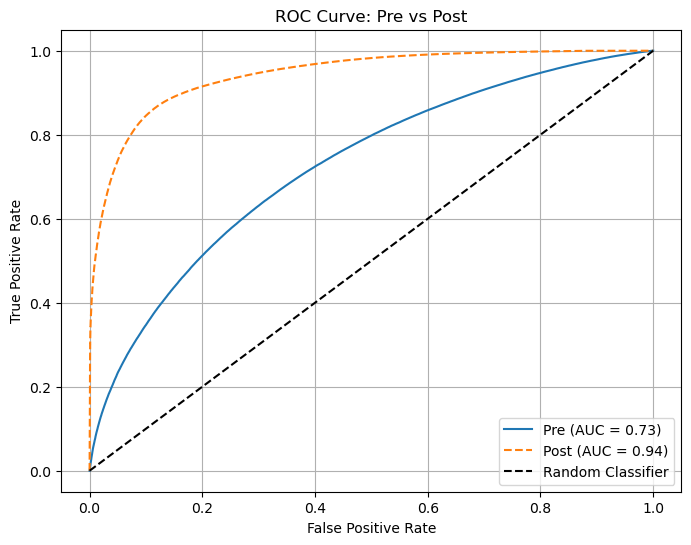

In [86]:
# visualizing using ROC curve
fpr_pre, tpr_pre, thresh = roc_curve(y_true_pre, np.array(y_prob_pre)[:, 1])
fpr_post, tpr_post, thresh = roc_curve(y_true_post, np.array(y_prob_post)[:, 1])

auc_pre = auc(fpr_pre, tpr_pre)
auc_post = auc(fpr_post, tpr_post)

# Plot ROC curves
plt.figure(figsize = (8, 6))

plt.plot(fpr_pre, tpr_pre, label = f'Pre (AUC = {auc_pre:.2f})')
plt.plot(fpr_post, tpr_post, label = f'Post (AUC = {auc_post:.2f})', linestyle='--')
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve: Pre vs Post')

plt.legend()
plt.grid(True)
plt.show()

### Classifiers and Optimization

**Taking a representative sample of 10,000**
- The full dataset takes way too long to experiment with
- Applying prepare() process to sample

In [300]:
data = X_post.copy()
data['target'] = y

class_counts = y.value_counts(normalize = True)

samples = []

for cls, frac in class_counts.items():
    cls_data = data[data['target'] == cls]
    n_cls_samples = int(10000 * frac)
    samples.append(cls_data.sample(n = n_cls_samples, random_state = 42))

sampled_data = pd.concat(samples).sample(frac = 1, random_state = 42) 
X_sampled = sampled_data.drop(columns = 'target')
y_sampled = sampled_data['target']

In [302]:
splits = prepare(X_sampled, y_sampled)

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:474: FutureWarning:

**For each of the following, a default model was compared to the tuned version**
- **Logistic Regression** - no change after tuning
- **Bayes** - nothing to tune
- **Decision Tree** - significant improvement
  - 0.08 increase in AUC
  - 'criterion': 'log_loss',
  - 'max_depth': 10,
  - 'max_features': None,
  - 'min_samples_leaf': 4,
  - 'min_samples_split': 5
- **Random Forest Classifier** - no change after tuning
  - Limited tuning due to computational complexity
- **XGBoost** - no improvement

ROC/AUC was optimized over accuracy due to focus on risky borrowers rather than all of them

#### Logistic Regression

In [453]:
# intialize model
lr = LogisticRegression()

In [455]:
# baseline model classification report
y_true, y_prob_lr1, y_pred_lr1 = model(splits, lr)
evaluate(y_true, y_pred_lr1)

,precision,recall,f1-score,support
0,0.514802,0.810427,0.629641,1266.000000
1,0.970022,0.889271,0.927893,8733.000000
accuracy,0.879288,0.879288,0.879288,0.879288
macro avg,0.742412,0.849849,0.778767,9999.000000
weighted avg,0.912386,0.879288,0.890130,9999.000000


In [457]:
# parameters to experiment
lr_params = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],  
    'solver': ['lbfgs', 'saga'] 
}

In [459]:
# finding best model
y_true, y_prob_lr2, y_pred_lr2, best_params_lr2 = tune(splits, lr, lr_params)

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max

ValueError: y should be a 1d array, got an array of shape (2000, 2) instead.

In [461]:
# best hyperparameters
best_params_lr

{'C': 10, 'penalty': 'l1', 'solver': 'saga'}

In [312]:
# classification report after tuning
evaluate(y_true, y_pred_lr2)

,precision,recall,f1-score,support
0,0.519879,0.815956,0.635106,1266.000000
1,0.970919,0.890759,0.929113,8733.000000
accuracy,0.881288,0.881288,0.881288,0.881288
macro avg,0.745399,0.853357,0.782110,9999.000000
weighted avg,0.913811,0.881288,0.891888,9999.000000


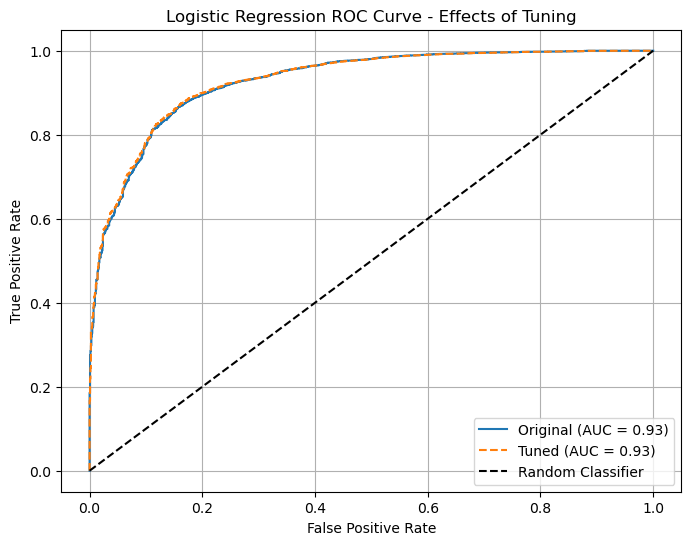

In [463]:
# visualizing using ROC curve
fpr_orig, tpr_orig, thresh = roc_curve(y_true, np.array(y_prob_lr1)[:, 1])
fpr_tuned, tpr_tuned, thresh = roc_curve(y_true, np.array(y_prob_lr2)[:, 1])

auc_orig = auc(fpr_orig, tpr_orig)
auc_tuned = auc(fpr_tuned, tpr_tuned)

# Plot ROC curves
plt.figure(figsize = (8, 6))

plt.plot(fpr_orig, tpr_orig, label = f'Original (AUC = {auc_orig:.2f})')
plt.plot(fpr_tuned, tpr_tuned, label = f'Tuned (AUC = {auc_tuned:.2f})', linestyle = '--')
plt.plot([0, 1], [0, 1], 'k--', label = 'Random Classifier')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Logistic Regression ROC Curve - Effects of Tuning')

plt.legend()
plt.grid(True)
plt.show()

#### Naive Gaussian Bayes

In [314]:
# intialize model
nb = GaussianNB()

In [315]:
# baseline model classification report
y_true, y_prob_nb1, y_pred_nb1 = model(splits, nb)
evaluate(y_true, y_pred_nb1)

,precision,recall,f1-score,support
0,0.595238,0.197472,0.296560,1266.000000
1,0.893935,0.980534,0.935234,8733.000000
accuracy,0.881388,0.881388,0.881388,0.881388
macro avg,0.744586,0.589003,0.615897,9999.000000
weighted avg,0.856116,0.881388,0.854370,9999.000000


#### Decision Tree

In [317]:
# intialize model
dt = DecisionTreeClassifier()

In [318]:
# baseline model classification report
y_true, y_prob_dt1, y_pred_dt1 = model(splits, dt)
evaluate(y_true, y_pred_dt1)

,precision,recall,f1-score,support
0,0.708987,0.785150,0.745127,1266.000000
1,0.968361,0.953281,0.960762,8733.000000
accuracy,0.931993,0.931993,0.931993,0.931993
macro avg,0.838674,0.869215,0.852945,9999.000000
weighted avg,0.935521,0.931993,0.933460,9999.000000


In [319]:
# parameters to experiment
dt_params = {
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_depth': [None, 5, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2']
}

In [320]:
# finding best model
y_true, y_prob_dt2, y_pred_dt2, best_params_dt2 = tune(splits, dt, dt_params)

In [321]:
# best hyperparameters
best_params_dt2

{'criterion': 'log_loss',
 'max_depth': 10,
 'max_features': None,
 'min_samples_leaf': 4,
 'min_samples_split': 5}

In [322]:
# classification report after tuning
evaluate(y_true, y_pred_dt2)

,precision,recall,f1-score,support
0,0.668345,0.838863,0.743958,1266.000000
1,0.975743,0.939654,0.957359,8733.000000
accuracy,0.926893,0.926893,0.926893,0.926893
macro avg,0.822044,0.889258,0.850658,9999.000000
weighted avg,0.936823,0.926893,0.930339,9999.000000


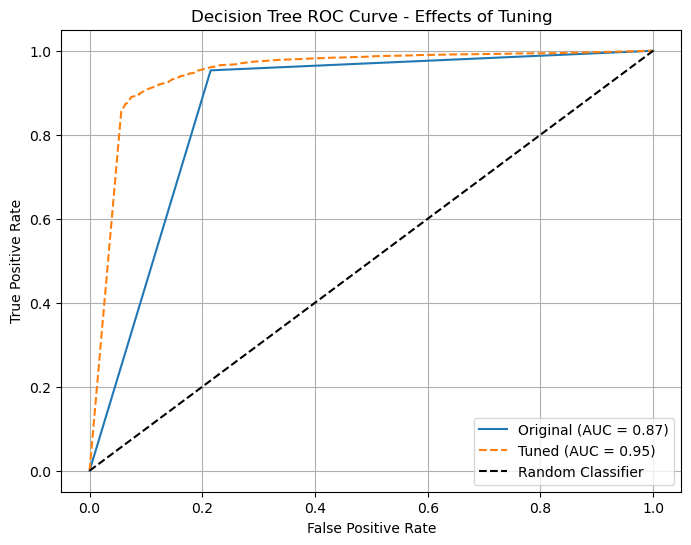

In [360]:
# visualizing using ROC curve
fpr_orig, tpr_orig, thresh = roc_curve(y_true, np.array(y_prob_dt1)[:, 1])
fpr_tuned, tpr_tuned, thresh = roc_curve(y_true, np.array(y_prob_dt2)[:, 1])

auc_orig = auc(fpr_orig, tpr_orig)
auc_tuned = auc(fpr_tuned, tpr_tuned)

# Plot ROC curves
plt.figure(figsize = (8, 6))

plt.plot(fpr_orig, tpr_orig, label = f'Original (AUC = {auc_orig:.2f})')
plt.plot(fpr_tuned, tpr_tuned, label = f'Tuned (AUC = {auc_tuned:.2f})', linestyle = '--')
plt.plot([0, 1], [0, 1], 'k--', label = 'Random Classifier')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree ROC Curve - Effects of Tuning')

plt.legend()
plt.grid(True)
plt.show()

#### Random Forest Classifier

In [324]:
# intialize model
rfc = RandomForestClassifier()

In [325]:
# baseline model classification report
y_true, y_prob_rfc1, y_pred_rfc1 = model(splits, rfc)
evaluate(y_true, y_pred_rfc1)

,precision,recall,f1-score,support
0,0.728958,0.745656,0.737212,1266.000000
1,0.963006,0.959808,0.961404,8733.000000
accuracy,0.932693,0.932693,0.932693,0.932693
macro avg,0.845982,0.852732,0.849308,9999.000000
weighted avg,0.933372,0.932693,0.933018,9999.000000


In [326]:
# parameters to experiment
rfc_params = {
    'n_estimators': [100, 300, 500],
    'max_depth': [None, 3, 5, 10],
}

In [327]:
# finding best model
y_true, y_prob_rfc2, y_pred_rfc2, best_params_rfc2 = tune(splits, rfc, rfc_params)

In [328]:
# best hyperparameters
best_params_rfc2

{'max_depth': None, 'n_estimators': 300}

In [329]:
# classification report after tuning
evaluate(y_true, y_pred_rfc2)

,precision,recall,f1-score,support
0,0.738959,0.740126,0.739542,1266.000000
1,0.962318,0.962098,0.962208,8733.000000
accuracy,0.933993,0.933993,0.933993,0.933993
macro avg,0.850639,0.851112,0.850875,9999.000000
weighted avg,0.934038,0.933993,0.934016,9999.000000


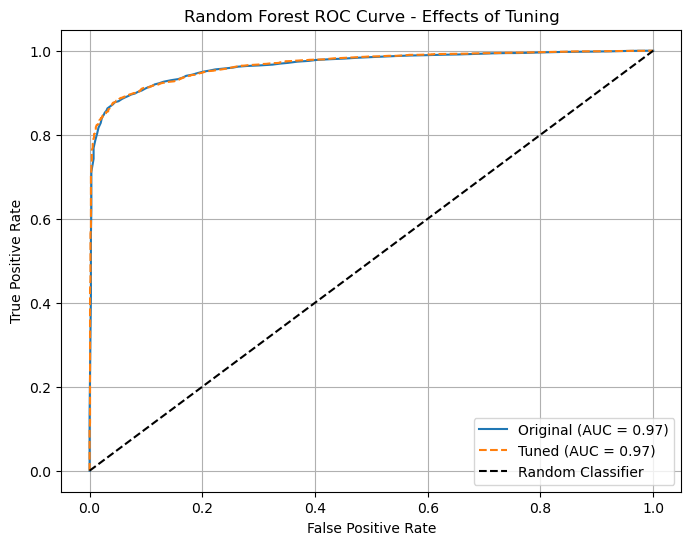

In [362]:
# visualizing using ROC curve
fpr_orig, tpr_orig, thresh = roc_curve(y_true, np.array(y_prob_rfc1)[:, 1])
fpr_tuned, tpr_tuned, thresh = roc_curve(y_true, np.array(y_prob_rfc2)[:, 1])

auc_orig = auc(fpr_orig, tpr_orig)
auc_tuned = auc(fpr_tuned, tpr_tuned)

# Plot ROC curves
plt.figure(figsize = (8, 6))

plt.plot(fpr_orig, tpr_orig, label = f'Original (AUC = {auc_orig:.2f})')
plt.plot(fpr_tuned, tpr_tuned, label = f'Tuned (AUC = {auc_tuned:.2f})', linestyle = '--')
plt.plot([0, 1], [0, 1], 'k--', label = 'Random Classifier')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest ROC Curve - Effects of Tuning')

plt.legend()
plt.grid(True)
plt.show()

#### XGBoost

In [331]:
# intialize model
xgb = XGBClassifier()

In [332]:
# baseline model classification report
y_true, y_prob_xgb1, y_pred_xgb1 = model(splits, xgb)
evaluate(y_true, y_pred_xgb1)

,precision,recall,f1-score,support
0,0.842812,0.842812,0.842812,1266.000000
1,0.977213,0.977213,0.977213,8733.000000
accuracy,0.960196,0.960196,0.960196,0.960196
macro avg,0.910012,0.910012,0.910012,9999.000000
weighted avg,0.960196,0.960196,0.960196,9999.000000


In [333]:
# parameters to experiment
xgb_params = {
    'n_estimators': [100, 200, 500],
    'max_depth': [3, 5, 7, 10],
    'learning_rate': [0.01, 0.05, 0.1, 0.3]
}

In [334]:
# finding best model
y_true, y_prob_xgb2, y_pred_xgb2, best_params_xgb = tune(splits, xgb, xgb_params)

In [335]:
# best hyperparameters
best_params_xgb

{'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 200}

In [336]:
# classification report after tuning
evaluate(y_true, y_pred_xgb2)

,precision,recall,f1-score,support
0,0.852895,0.860979,0.856918,1266.000000
1,0.979819,0.978472,0.979145,8733.000000
accuracy,0.963596,0.963596,0.963596,0.963596
macro avg,0.916357,0.919726,0.918032,9999.000000
weighted avg,0.963749,0.963596,0.963670,9999.000000


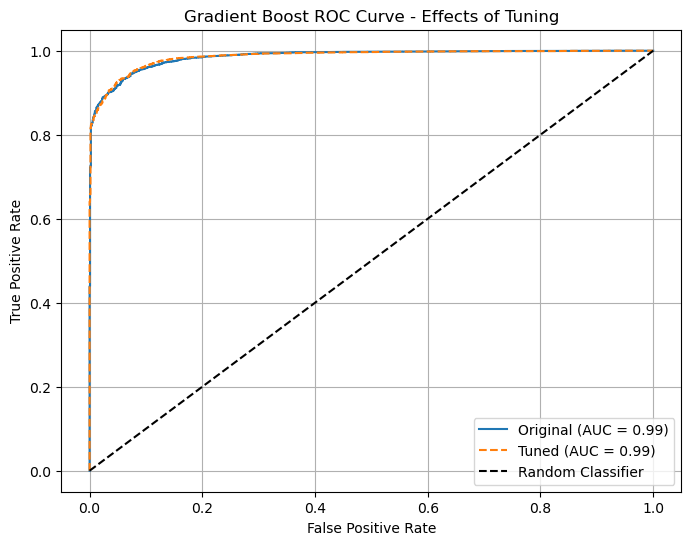

In [366]:
# visualizing using ROC curve
fpr_orig, tpr_orig, thresh = roc_curve(y_true, np.array(y_prob_xgb1)[:, 1])
fpr_tuned, tpr_tuned, thresh = roc_curve(y_true, np.array(y_prob_xgb2)[:, 1])

auc_orig = auc(fpr_orig, tpr_orig)
auc_tuned = auc(fpr_tuned, tpr_tuned)

# Plot ROC curves
plt.figure(figsize = (8, 6))

plt.plot(fpr_orig, tpr_orig, label = f'Original (AUC = {auc_orig:.2f})')
plt.plot(fpr_tuned, tpr_tuned, label = f'Tuned (AUC = {auc_tuned:.2f})', linestyle = '--')
plt.plot([0, 1], [0, 1], 'k--', label = 'Random Classifier')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Gradient Boost ROC Curve - Effects of Tuning')

plt.legend()
plt.grid(True)
plt.show()

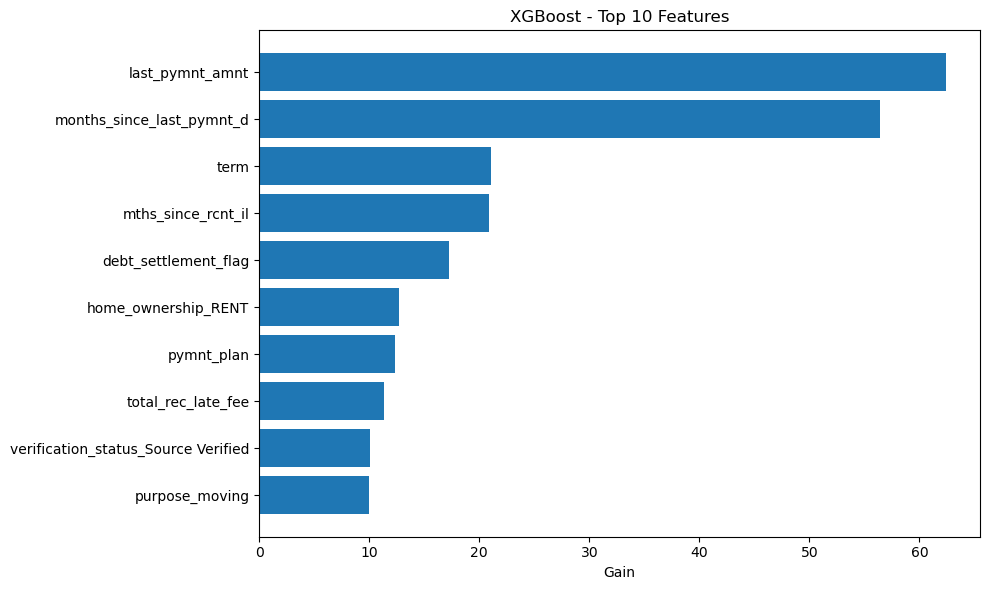

In [537]:
booster = xgb.get_booster()
booster.feature_names = X_sampled.columns.tolist()

importance_dict = booster.get_score(importance_type = 'gain')  # or 'weight', etc.

importance_df = pd.DataFrame({
    'Feature': list(importance_dict.keys()),
    'Importance': list(importance_dict.values())
})

top_features = importance_df.sort_values(by = 'Importance', ascending = False).head(10)

plt.figure(figsize = (10, 6))
plt.barh(top_features['Feature'][::-1], top_features['Importance'][::-1])
plt.xlabel('Gain')
plt.title('XGBoost - Top 10 Features')
plt.tight_layout()
plt.show()

#### Stacking

**Seeing if building a stacked model improves score**
- It performs similarly to just using random forest

In [391]:
base = [
    ('rf', RandomForestClassifier(n_estimators = 300, random_state = 42)),
    ('xgb', XGBClassifier(n_estimators = 200, learning_rate = 0.1, max_depth = 10, random_state = 42))
]

meta = LogisticRegression()

stack = StackingClassifier(
    estimators = base,
    final_estimator = meta,
    n_jobs = -1,
    passthrough = True
)

In [393]:
# baseline model classification report
y_true, y_prob_stack, y_pred_stack = model(splits, stack)
evaluate(y_true, y_pred_stack)

,precision,recall,f1-score,support
0,0.835052,0.831754,0.833399,1266.000000
1,0.975624,0.976182,0.975903,8733.000000
accuracy,0.957896,0.957896,0.957896,0.957896
macro avg,0.905338,0.903968,0.904651,9999.000000
weighted avg,0.957825,0.957896,0.957860,9999.000000


#### CNN

**Building a convolutional neural network**
- Architecture Overview
    - Sequential Model: linear stack of layers, simple feedforward structure
    - Conv1D Layer (64 filters, kernel size 3): finds local patterns using 1D convolution with ReLU activation
    - MaxPooling1D (pool size 2): downsamples to reduce dimensionality and computation
    - BatchNormalization: normalizes activations to stabilize and accelerate training
    - Dropout (0.3): randomly deactivates 30% of neurons to prevent overfitting
    - Flatten: 2D outputs --> 1D vector for the dense layers
    - Dense Layer (64 units, ReLU): learns complex patterns with fully connected neurons.
    - Dropout (0.3): further regularization
    - Output Layer (1 unit, Sigmoid): probability for binary classification
- Best performance as expected

In [432]:
cnn = Sequential()

cnn.add(Conv1D(filters = 64, kernel_size = 3, activation = 'relu', input_shape = (72, 1)))
cnn.add(MaxPooling1D(pool_size = 2))
cnn.add(BatchNormalization())
cnn.add(Dropout(0.3))
cnn.add(Flatten())
cnn.add(Dense(64, activation = 'relu'))
cnn.add(Dropout(0.3))
cnn.add(Dense(1, activation = 'sigmoid'))  

cnn.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

/opt/anaconda3/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [414]:
splits[0][0].shape

(13972, 72)

In [434]:
y_true = []
y_pred_cnn = []
y_prob_cnn = []

for X_train, y_train, X_test, y_test in splits:
    X_train_cnn = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
    cnn.fit(X_train_cnn, y_train, epochs = 10, batch_size = 32)

for X_train, y_train, X_test, y_test in splits:
    X_test_cnn = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))
    y_prob = cnn.predict(X_test_cnn)
    y_true.extend(y_test)
    y_prob_cnn.extend(y_prob)
    y_pred_cnn.extend((y_prob > 0.5).astype(int).flatten())

Epoch 1/10
437/437 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.8180 - loss: 0.4450
Epoch 2/10
437/437 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9162 - loss: 0.2196
Epoch 3/10
437/437 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9313 - loss: 0.1842
Epoch 4/10
437/437 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9430 - loss: 0.1522
Epoch 5/10
437/437 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9472 - loss: 0.1428
Epoch 6/10
437/437 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9545 - loss: 0.1250
Epoch 7/10
437/437 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9507 - loss: 0.1326
Epoch 8/10
437/437 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9546 - loss: 0.1181
Epoch 9/10
437/437 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9632 - loss: 0.1016
Epoch 10/10
437/437 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9629 - loss: 0.1051
Epoch 1/10
437/437 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.9440 - loss: 0.1507
Epoch 2/10
437/437 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step -

In [436]:
evaluate(y_true, y_pred_cnn)

,precision,recall,f1-score,support
0,0.929811,0.973144,0.950984,1266.000000
1,0.996080,0.989351,0.992704,8733.000000
accuracy,0.987299,0.987299,0.987299,0.987299
macro avg,0.962946,0.981247,0.971844,9999.000000
weighted avg,0.987690,0.987299,0.987422,9999.000000


In [480]:
# baseline confusion matrix
cm = confusion_matrix(y, y_pred_baseline)

# plotting
display = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = ['Risky', 'Safe'])
disp.plot(cmap = 'Blues')
plt.title('Baseline Confusion Matrix')

plt.tight_layout()
plt.show()

NameError: name 'y_pred_baseline' is not defined

### Classifier Comparison

**Summarizing results in a table and graphing ROC/AUCs**
- Best: XGBoost
- Worst: Bayes
- Decision tree and random forest were similar and not far behind
- Logistic regression was not bad

In [515]:
evals = [
    evaluate(y_true, y_pred_lr2),
    evaluate(y_true, y_pred_nb1),
    evaluate(y_true, y_pred_dt2),
    evaluate(y_true, y_pred_rfc2),
    evaluate(y_true, y_pred_xgb2),
    evaluate(y_true, y_pred_stack),
    evaluate(y_true, y_pred_cnn)
]

models = [
    "Logistic Regression",
    "Naive Bayes",
    "Decision Tree",
    "Random Forest",
    "XGBoost",
    "Stacking",
    "CNN"
]

In [517]:
summary_df = summarize(evals, models)
summary_df

,precision_0,recall_0,f1_0,precision_1,recall_1,f1_1,accuracy
model,,,,,,,
Logistic Regression,0.519879,0.815956,0.635106,0.970919,0.890759,0.929113,0.881288
Naive Bayes,0.595238,0.197472,0.296560,0.893935,0.980534,0.935234,0.881388
Decision Tree,0.668345,0.838863,0.743958,0.975743,0.939654,0.957359,0.926893
Random Forest,0.738959,0.740126,0.739542,0.962318,0.962098,0.962208,0.933993
XGBoost,0.852895,0.860979,0.856918,0.979819,0.978472,0.979145,0.963596
Stacking,0.831363,0.833333,0.832347,0.975830,0.975495,0.975663,0.957496
CNN,0.929811,0.973144,0.950984,0.996080,0.989351,0.992704,0.987299


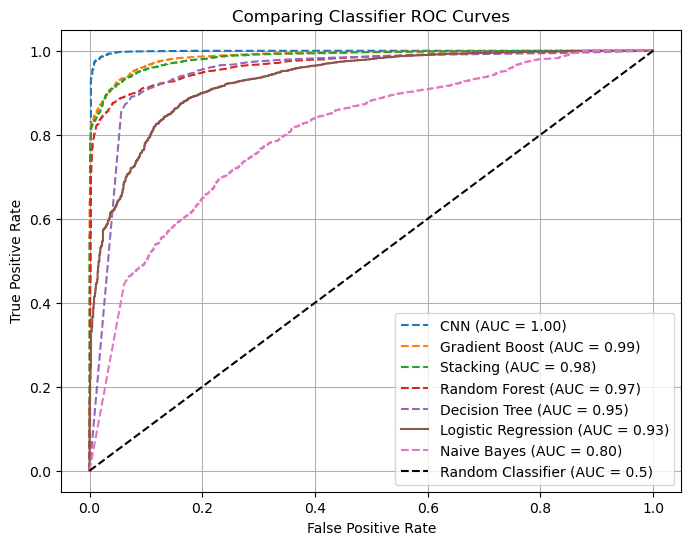

In [488]:
# visualizing using ROC curve
fpr_cnn, tpr_cnn, thresh = roc_curve(y_true, np.array(y_prob_cnn))
fpr_stack, tpr_stack, thresh = roc_curve(y_true, np.array(y_prob_stack)[:, 1])
fpr_lr, tpr_lr, thresh = roc_curve(y_true, np.array(y_prob_lr2)[:, 1])
fpr_nb, tpr_nb, thresh = roc_curve(y_true, np.array(y_prob_nb1)[:, 1])
fpr_dt, tpr_dt, thresh = roc_curve(y_true, np.array(y_prob_dt2)[:, 1])
fpr_rfc, tpr_rfc, thresh = roc_curve(y_true, np.array(y_prob_rfc2)[:, 1])
fpr_xgb, tpr_xgb, thresh = roc_curve(y_true, np.array(y_prob_xgb2)[:, 1])

auc_cnn = auc(fpr_cnn, tpr_cnn)
auc_stack = auc(fpr_stack, tpr_stack)
auc_lr = auc(fpr_lr, tpr_lr)
auc_nb = auc(fpr_nb, tpr_nb)
auc_dt = auc(fpr_dt, tpr_dt)
auc_rfc = auc(fpr_rfc, tpr_rfc)
auc_xgb = auc(fpr_xgb, tpr_xgb)

# Plot ROC curves
plt.figure(figsize = (8, 6))

plt.plot(fpr_cnn, tpr_cnn, label = f'CNN (AUC = {auc_cnn:.2f})', linestyle = '--')
plt.plot(fpr_xgb, tpr_xgb, label = f'Gradient Boost (AUC = {auc_xgb:.2f})', linestyle = '--')
plt.plot(fpr_stack, tpr_stack, label = f'Stacking (AUC = {auc_stack:.2f})', linestyle = '--')
plt.plot(fpr_rfc, tpr_rfc, label = f'Random Forest (AUC = {auc_rfc:.2f})', linestyle = '--')
plt.plot(fpr_dt, tpr_dt, label = f'Decision Tree (AUC = {auc_dt:.2f})', linestyle = '--')
plt.plot(fpr_lr, tpr_lr, label = f'Logistic Regression (AUC = {auc_lr:.2f})')
plt.plot(fpr_nb, tpr_nb, label = f'Naive Bayes (AUC = {auc_nb:.2f})', linestyle = '--')

plt.plot([0, 1], [0, 1], 'k--', label = 'Random Classifier (AUC = 0.5)')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Comparing Classifier ROC Curves')

plt.legend()
plt.grid(True)
plt.show()